<a href="https://colab.research.google.com/github/drmshyamaladevi/Gradient-Transformer-Self-Attention-U-Net-/blob/main/CrackDefect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:

!pip install keras_unet_collection

In [ ]:
import keras
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from numpy import zeros, random

# Data
from tensorflow.image import resize
from keras.preprocessing.image import load_img, img_to_array

# Data viz
import matplotlib.pyplot as plt

# Model
from keras.models import Model, Sequential, load_model
from keras.layers import Conv2D, Conv2DTranspose, concatenate, MaxPool2D, Dropout, BatchNormalization, Layer, Input, add, multiply, UpSampling2D

# Model Viz
from tensorflow.keras.utils import plot_model

# Callback
from keras.callbacks import Callback

In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
from datetime import datetime
from PIL import Image
import random
import tensorflow as tf

from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.metrics import MeanIoU

from keras_unet_collection import losses

from sklearn.model_selection import train_test_split

In [ ]:

augmented_images_dir_path = "/content/drive/MyDrive/Crack/img"
augmented_masks_dir_path =  "/content/drive/MyDrive/Crack/mask"

In [ ]:

image_names = glob.glob(f"{augmented_images_dir_path}/*.jpg")
image_names.sort()


image_dataset = []

for image_name in image_names:
      image = cv2.imread(image_name, 1)
      image = Image.fromarray(image)
      image_dataset.append(np.array(image))

In [ ]:

mask_names = glob.glob(f"{augmented_masks_dir_path}/*.jpg")
mask_names.sort()

mask_dataset = []

for image_name in mask_names:
        image = cv2.imread(image_name, 0)
        image = np.where(image>0, 255, image)
        image = Image.fromarray(image)
        mask_dataset.append(np.array(image))

In [ ]:

names = []
for i in range(len(os.listdir(augmented_masks_dir_path))):
  img_name = image_names[i].split("/")[-1]
  mask_name = mask_names[i].split("/")[-1]

  n1 = img_name.split(".")[0]
  n2 = mask_name.split(".")[0]
  names.append(n1==n2)

all(names)


True

In [ ]:

image_dataset = np.array(image_dataset)/255.
mask_dataset = np.expand_dims((np.array(mask_dataset)),3) /255.

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(image_dataset, mask_dataset, test_size = 0.20, random_state = 9)

In [ ]:


X_train.shape

(32, 227, 227, 3)

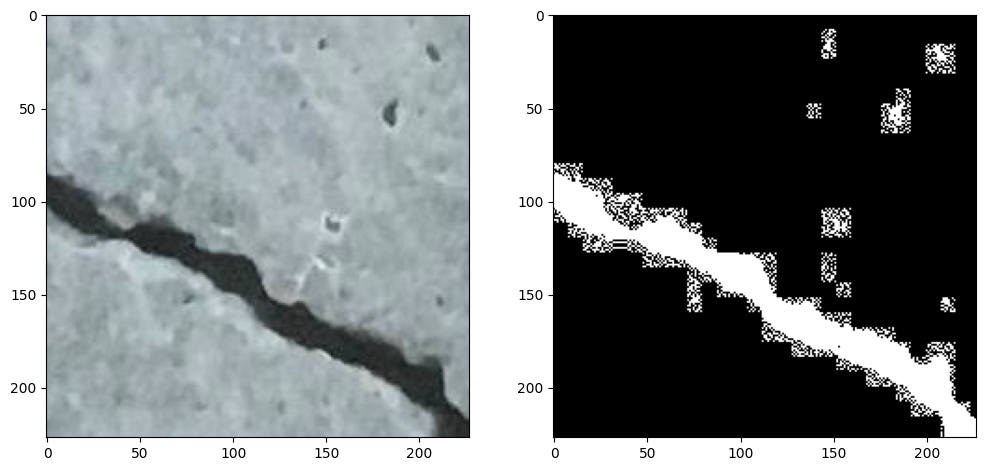

In [ ]:
#Sanity check
image_number = random.randint(0, len(X_train))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(X_train[image_number], (227, 227, 3)), cmap='gray')
plt.subplot(122)
plt.imshow(np.reshape(y_train[image_number], (227, 227)), cmap='gray')
plt.show()

In [ ]:
def load_image(path):
    img = resize( img_to_array( load_img(path) )/255. , (256,256))
    return img

In [ ]:
root_path = '/content/drive/MyDrive/Crack/'

In [ ]:
root_path = '/content/drive/MyDrive/Crack/img/'
image_paths = sorted(glob(root_path + f"*.jpg"))
mask_paths = []
for path in image_paths:
    mask_path = path.replace('img','mask')
    mask_path = mask_path.replace('.jpg','.jpg')
    mask_paths.append(mask_path)
print(f"Total Number of Images  : {len(image_paths)}")

Total Number of Images  : 40


In [ ]:
images = zeros(shape=(len(image_paths), 256, 256, 3))
masks = zeros(shape=(len(image_paths), 256, 256, 3))
for n, (img_path, mask_path) in tqdm(enumerate(zip(image_paths, mask_paths)), desc="Loading"):
    images[n] = load_image(img_path)
    masks[n] = load_image(mask_path)

Loading: 40it [00:00, 67.85it/s]


In [ ]:

X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size = 0.20, random_state = 9)

In [ ]:

X_train.shape

(32, 256, 256, 3)

In [ ]:
y_train.shape

(32, 256, 256, 3)

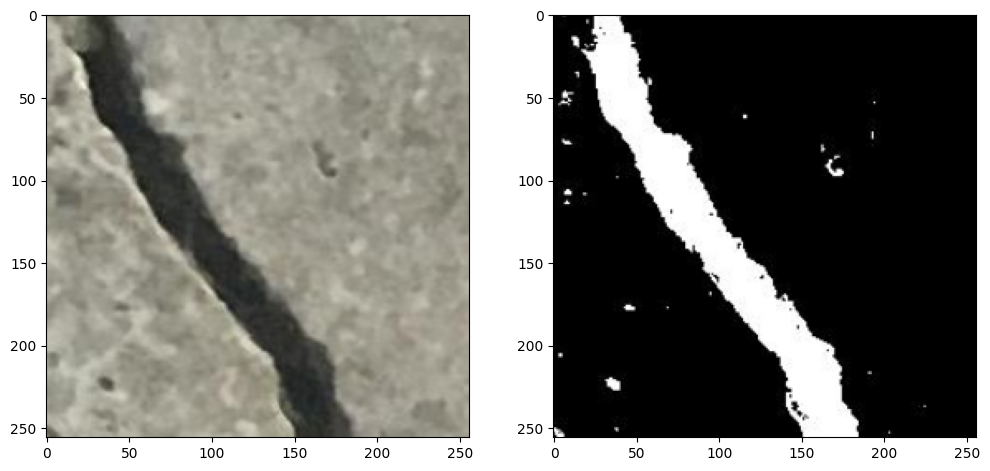

In [ ]:
#Sanity check
image_number = random.randint(0, len(X_train))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(X_train[image_number], (256, 256, 3)), cmap='gray')
plt.subplot(122)
plt.imshow(np.reshape(y_train[image_number], (256, 256,3)), cmap='gray')
plt.show()

In [ ]:

from keras_unet_collection import losses
metrics_set=[ tf.keras.metrics.BinaryIoU(target_class_ids=[1]), losses.dice_coef]

In [ ]:

IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]
input_shape = (IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)
num_labels = 1  #Binary
batch_size = 16
epochs = 10


In [ ]:
y_train = y_train[:,:,:,1] # Select channel 1 of y_train
y_train = y_train[..., None]

In [ ]:
y_train = y_train[:,:,:,0]
y_train = np.expand_dims(y_train, axis=-1)

y_test = y_test[:,:,:,0]
y_test = np.expand_dims(y_test, axis=-1)

In [ ]:
filepath = '/content/drive/MyDrive/attunet_model.keras'
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor="val_dice_coef",
                             verbose=1,
                             save_best_only=True,
                             mode="max")

earlyStopping = EarlyStopping(patience=5)

callbacks = [checkpoint, earlyStopping]


In [ ]:
from keras_unet_collection.models import att_unet_2d

In [ ]:

model = att_unet_2d((256, 256, 3),
                      filter_num=[64, 128, 256, 512, 1024],
                      n_labels=1,
                      stack_num_down=2,
                      stack_num_up=2, activation='ReLU',
                      atten_activation='ReLU'
                      , attention='add',
                      output_activation='Sigmoid',
                      batch_norm=True,
                      pool=False,
                      unpool=False,
                      backbone='VGG16',
                      weights='imagenet',
                      freeze_backbone=True,
                      freeze_batch_norm=True,
                      name='attunet'
                      )


In [ ]:

model.compile(loss=tf.keras.losses.binary_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              metrics=metrics_set)

In [ ]:
start = datetime.now()
history = model.fit(X_train, y_train,
                    verbose=1,
                    batch_size = batch_size,
                    validation_data=(X_test, y_test ),
                    epochs=epochs,
                    callbacks=callbacks)

stop = datetime.now()

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96s/step - binary_io_u_2: 0.2472 - dice_coef: 0.3711 - loss: 0.4297  
Epoch 1: val_dice_coef improved from 0.28045 to 0.30009, saving model to /content/drive/MyDrive/attunet_model.keras
2/2 ━━━━━━━━━━━━━━━━━━━━ 221s 123s/step - binary_io_u_2: 0.2486 - dice_coef: 0.3712 - loss: 0.4270 - val_binary_io_u_2: 0.0763 - val_dice_coef: 0.3001 - val_loss: 0.9598
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96s/step - binary_io_u_2: 0.2887 - dice_coef: 0.3902 - loss: 0.3763   
Epoch 2: val_dice_coef improved from 0.30009 to 0.30604, saving model to /content/drive/MyDrive/attunet_model.keras
2/2 ━━━━━━━━━━━━━━━━━━━━ 283s 144s/step - binary_io_u_2: 0.2941 - dice_coef: 0.3934 - loss: 0.3737 - val_binary_io_u_2: 0.0763 - val_dice_coef: 0.3060 - val_loss: 1.0055
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96s/step - binary_io_u_2: 0.3180 - dice_coef: 0.4082 - loss: 0.3362   
Epoch 3: val_dice_coef improved from 0.30604 to 0.30989, saving model to /content/drive/MyDrive/att

In [ ]:

print(f"Execution time: {stop-start}")


Execution time: 0:21:49.745116


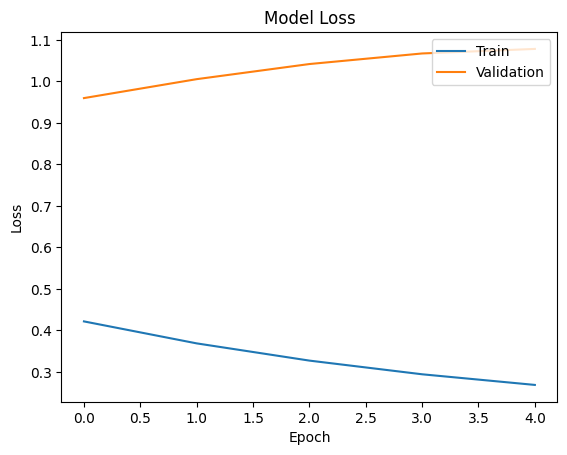

In [ ]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


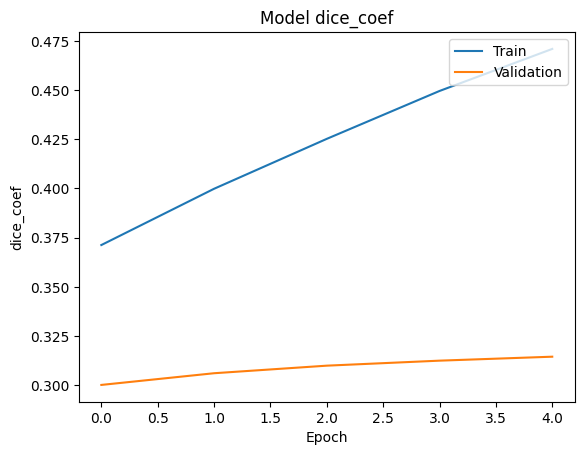

In [ ]:

plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('Model dice_coef')
plt.xlabel('Epoch')
plt.ylabel('dice_coef')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


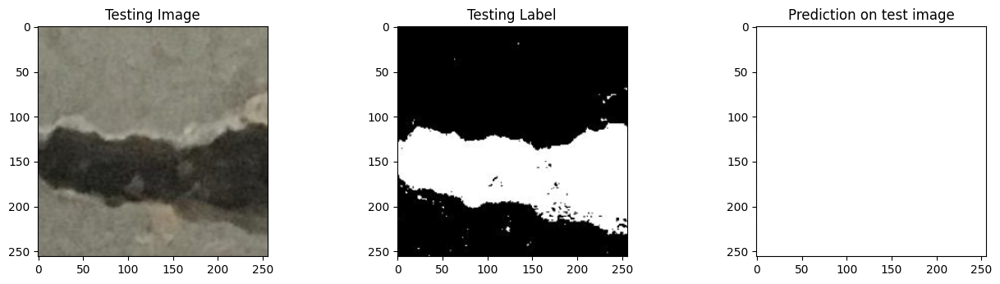

In [ ]:
import random
test_img_number = random.randint(0, X_test.shape[0]-1)
test_img = X_test[test_img_number]
ground_truth=y_test[test_img_number]

test_img_input=np.expand_dims(test_img, 0)
prediction = (model.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img, cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction, cmap='gray')

plt.show()

In [ ]:

import pandas as pd
n_classes = 2

IoU_values = []
for img in range(0, X_test.shape[0]):
    temp_img = X_test[img]
    ground_truth=y_test[img]
    temp_img_input=np.expand_dims(temp_img, 0)
    prediction = (model.predict(temp_img_input)[0,:,:,0] > 0.5).astype(np.uint8)

    IoU = MeanIoU(num_classes=n_classes)
    IoU.update_state(ground_truth[:,:,0], prediction)
    IoU = IoU.result().numpy()
    IoU_values.append(IoU)

df = pd.DataFrame(IoU_values, columns=["IoU"])
df = df[df.IoU != 1.0]
mean_IoU = df.mean().values

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


In [ ]:

print(f"Mean IoU for test dataset is: {round(mean_IoU[0]*100,2)}%")

Mean IoU for test dataset is: 3.9%


In [ ]:

import matplotlib.pyplot as plt
%matplotlib inline

def ax_decorate_box(ax):
    [j.set_linewidth(0) for j in ax.spines.values()]
    ax.tick_params(axis="both", which="both", bottom=False, top=False, \
               labelbottom=False, left=False, right=False, labelleft=False)
    return ax

In [ ]:

y_pred = model.predict([X_test])

1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step


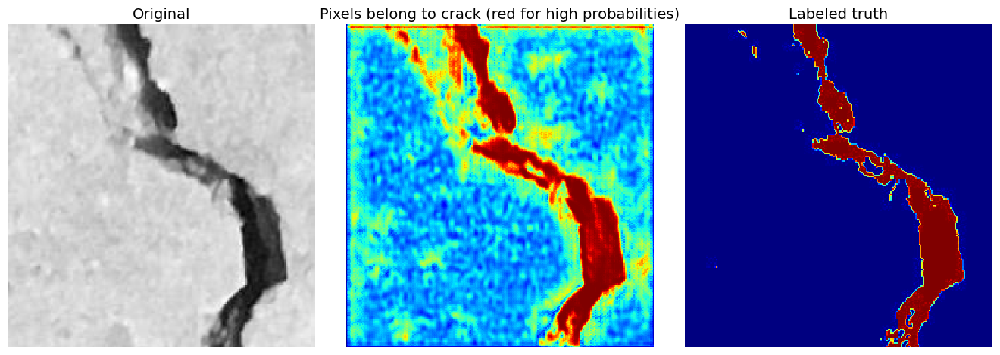

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

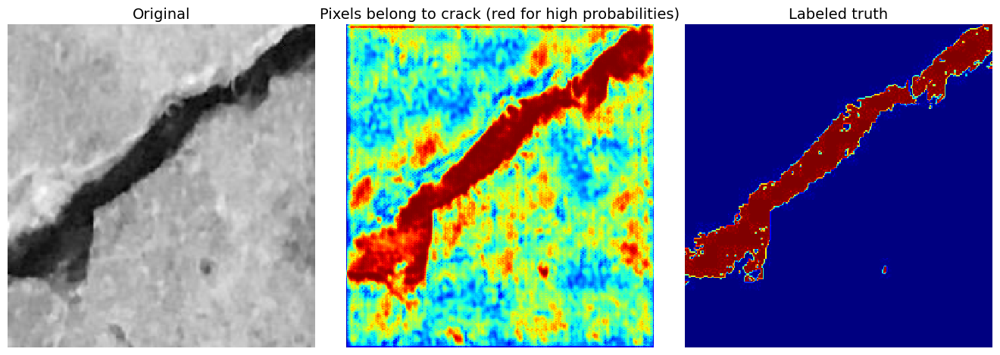

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

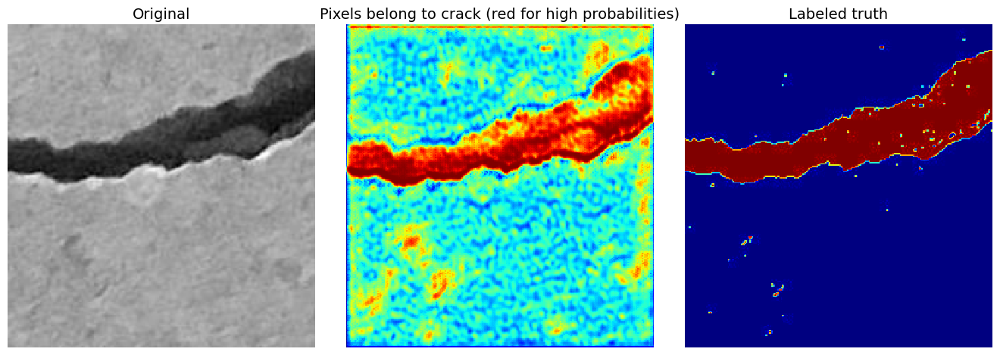

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

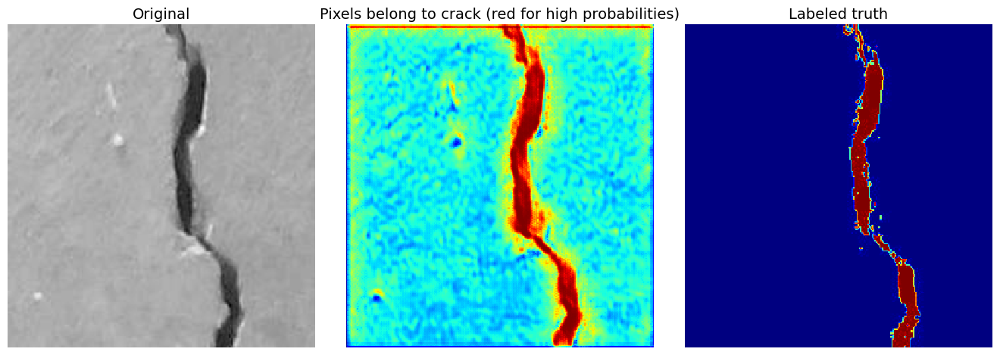

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

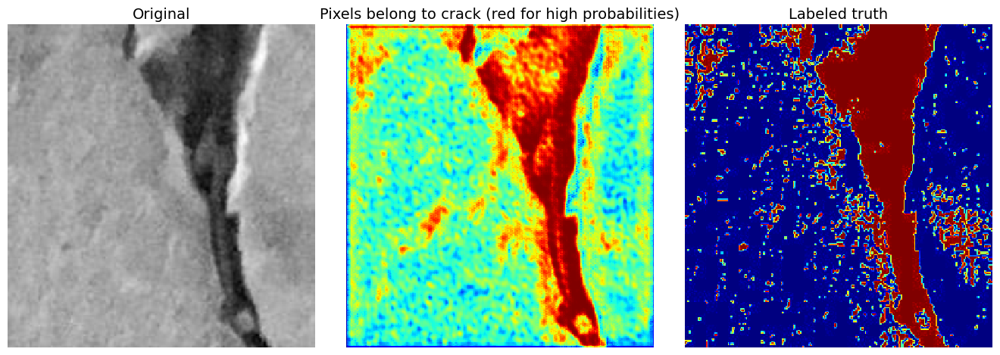

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

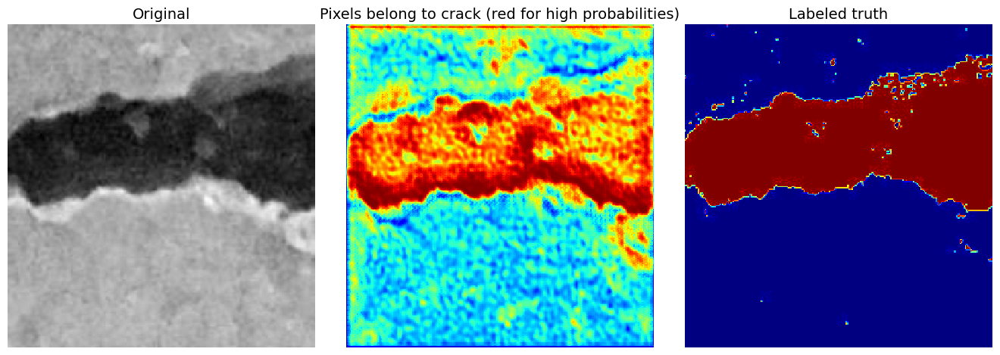

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

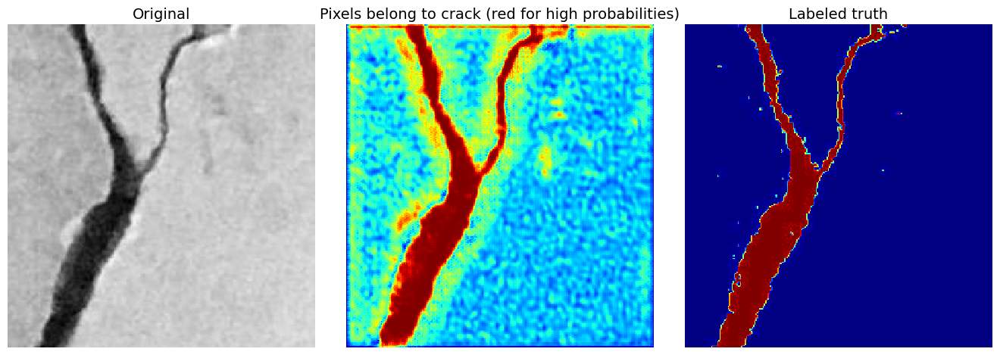

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

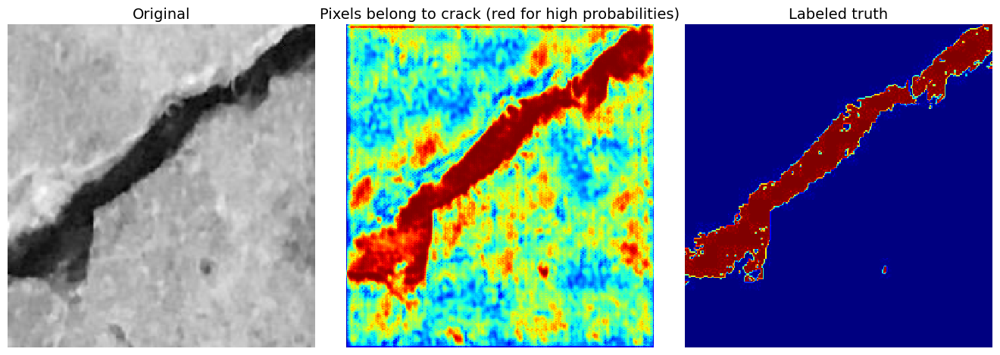

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

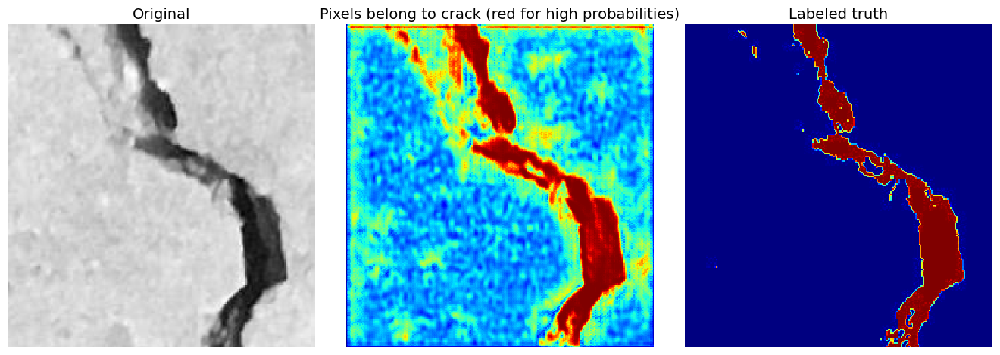

In [ ]:
i_sample = random.randint(0, X_test.shape[0]-1)

fig, AX = plt.subplots(1, 3, figsize=(13, (13-0.2)/3))
plt.subplots_adjust(0, 0, 1, 1, hspace=0, wspace=0.1)
for ax in AX:
    ax = ax_decorate_box(ax)
AX[0].pcolormesh(np.mean(X_test[i_sample, ...,], axis=-1), cmap=plt.cm.gray)
AX[1].pcolormesh(y_pred[i_sample, ..., 0], cmap=plt.cm.jet)
AX[2].pcolormesh(y_test[i_sample, ..., 0], cmap=plt.cm.jet)

AX[0].set_title("Original", fontsize=14);
AX[1].set_title("Pixels belong to crack (red for high probabilities)", fontsize=14);
AX[2].set_title("Labeled truth", fontsize=14);

In [ ]:

from tensorflow.keras.utils import normalize
import os
import cv2
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import glob
from skimage.morphology import medial_axis
from skimage import img_as_ubyte
from  scipy import ndimage
from keras.models import load_model
from skimage.morphology import medial_axis, label
import math
from skimage.measure import label, regionprops
import random

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size = 0.2, random_state = 9)

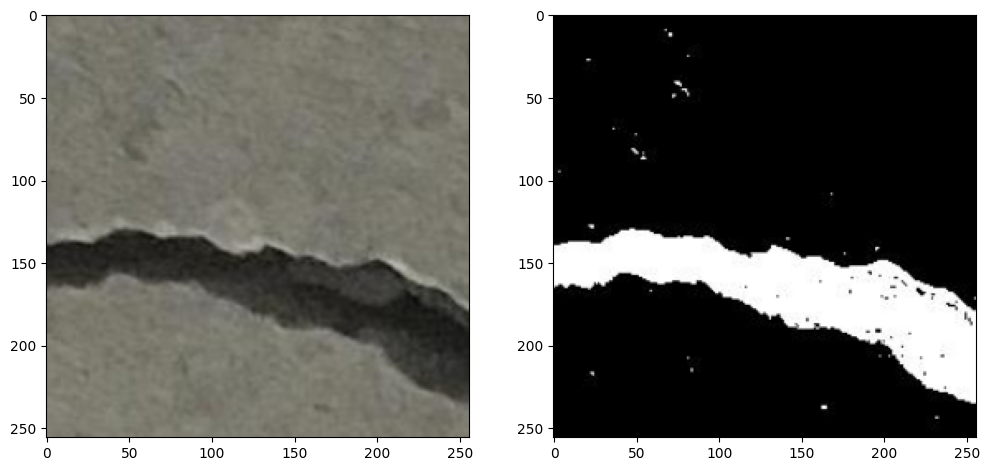

In [ ]:
image_number = random.randint(0, len(X_test)-1)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(X_test[image_number], (256,256,3)), cmap='gray')
plt.subplot(122)
plt.imshow(np.reshape(y_test[image_number], (256,256,3)), cmap='gray')

In [ ]:

# crack instance segment

def instance_segment(np_image):
  # get crack
  # im_original = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
  rgb_original = cv2.cvtColor(np_image, cv2.COLOR_GRAY2RGB)  # rgb just for demo purpose
  if len(np.unique(np_image)) == 1:
    # print("no crack")
    return np_image, 0

  labeled = label(np_image, background=0)
  pixel_values = np.unique(labeled)
  cracks = [np.where(labeled != label, 0, labeled) for label in pixel_values]
  del cracks[0]

  return cracks

In [ ]:
from skimage.morphology import skeletonize
def filter_crack_instances(cracks, np_image):

  instances = []
  for crack_instance in cracks:
      im = crack_instance.astype(np.uint8) * 255
      rgb = cv2.cvtColor(im, cv2.COLOR_GRAY2RGB)  # rgb just for demo purpose
      _, crack = cv2.threshold(im, 50, 255, cv2.THRESH_BINARY)

      # get medial axis
      med_plot = np.zeros((256,256), np.uint8)
      medial, distance = medial_axis(im, return_distance=True)
      med_img = img_as_ubyte(medial)
      med_contours, _ = cv2.findContours(med_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
      cv2.drawContours(med_plot, med_contours, -1, (255, 0, 0), 1)
      med_pts = [v[0] for v in med_contours[0]]

      # get point with maximal distance from medial axis
      max_idx = np.argmax(distance)
      max_pos = np.unravel_index(max_idx, distance.shape)
      max_dist = distance[max_pos]
      coords = np.array([max_pos[1], max_pos[0]])
      # print(f"max distance from medial axis to boundary = {max_dist} at x,y: {coords}")

      border_values = {0, 256}
      if coords[1] in border_values or coords[0] in border_values:
        continue

      # interpolate orthogonal of medial axis at coords
      delta = 3
      try:
          idx = next(i for i, v in enumerate(med_pts) if (v == coords).all())
      except StopIteration:
          continue

      px1, py1 = med_pts[(idx-delta) % len(med_pts)]
      px2, py2 = med_pts[(idx+delta) % len(med_pts)]
      orth = np.array([py1 - py2, px2 - px1]) * max(im.shape)
      # intersect orthogonal with crack and get contour
      orth_img = np.zeros(im.shape, dtype=np.uint8)
      A = tuple(coords + orth)
      B = tuple(coords - orth)
      cv2.line(orth_img, A, B, color=255, thickness=1)
      gap_img = cv2.bitwise_and(orth_img, crack)

      gap_contours, _ = cv2.findContours(gap_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
      gap_pts = [v[0] for v in gap_contours[0]]

      if len(gap_pts) == 1:
        continue

      # determine the end points of the gap contour by negative dot product
      n = len(gap_pts)
      gap_ends = [
      p for i, p in enumerate(gap_pts)
      if np.dot(p - gap_pts[(i-1) % n], gap_pts[(i+1) % n] - p) < 0
      ]
      # print(f"Maximum gap found from {gap_ends[0]} to {gap_ends[1]}")

      C = tuple(gap_ends[0])
      D = tuple(gap_ends[1])
      distance = round(calculate_euclidean_distance(C,D),3)
      instances.append([[C,D], distance])

  return instances

In [ ]:

def calculate_euclidean_distance(p1,p2):
  s1 = (math.pow(p1[0] - p2[0],2))
  s2 = (math.pow(p1[1] - p2[1],2))
  euclidean_distance = math.sqrt(s1+s2)
  return euclidean_distance


def get_boundary(numpy_img, pixel_value):
  canny_Img = cv2.Canny(numpy_img,100,200)
  contours,_ = cv2.findContours(canny_Img,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
  canvas = np.zeros_like(numpy_img)
  boundary = cv2.drawContours(canvas , contours, -1, pixel_value, 1)
  return boundary


def crack_measurement(np_image):
  # get crack
  # im_original = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
  rgb_original = cv2.cvtColor(np_image, cv2.COLOR_GRAY2RGB)  # rgb just for demo purpose
  if len(np.unique(np_image)) == 1:
    # print("no crack")
    return np_image, 0

  labeled = label(np_image, background=0)
  pixel_values = np.unique(labeled)
  cracks = [np.where(labeled != label, 0, labeled) for label in pixel_values]
  if len(cracks) > 1:
    del cracks[0]

  crack_list = filter_crack_instances(cracks, np_image)
  if crack_list == []:
    return np_image, 0

  crack_line_points = []
  d = 0
  for crack_prop in crack_list:
    if crack_prop[1] > d:
      d = crack_prop[1]
      crack_line_points = crack_prop[0]

  rgb_original = cv2.line(rgb_original, crack_line_points[0], crack_line_points[1], color=(0, 0, 255), thickness=1)
  text = str(d) + "px"
  rgb_original = cv2.putText(rgb_original, text, (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)


  return rgb_original, d


In [ ]:
!pip install keras_unet_collection
from keras_unet_collection.transformer_layers import patch_extract, patch_embedding
from keras_unet_collection.activations import GELU

In [ ]:
def crack_measurement(np_image):
  # get crack
  # im_original = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
  # rgb_original = cv2.cvtColor(np_image, cv2.COLOR_GRAY2RGB)  # rgb just for demo purpose
  rgb_original = np_image # np_image is already in RGB format, no need to convert
  if len(np.unique(np_image)) == 1:
    # print("no crack")
    return np_image, 0

  # Convert the image to grayscale before further processing
  gray_image = cv2.cvtColor(np_image, cv2.COLOR_RGB2GRAY)

  labeled = label(gray_image, background=0) # Use the grayscale image here
  pixel_values = np.unique(labeled)
  cracks = [np.where(labeled != label, 0, labeled) for label in pixel_values]
  if len(cracks) > 1:
    del cracks[0]

  crack_list = filter_crack_instances(cracks, gray_image) # Use the grayscale image here
  if crack_list == []:
    return np_image, 0

  crack_line_points = []
  d = 0
  for crack_prop in crack_list:
    if crack_prop[1] > d:
      d = crack_prop[1]
      crack_line_points = crack_prop[0]

  rgb_original = cv2.line(rgb_original, crack_line_points[0], crack_line_points[1], color=(0, 0, 255), thickness=1)
  text = str(d) + "px"
  rgb_original = cv2.putText(rgb_original, text, (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)


  return rgb_original, d

analyzing image number: 15
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


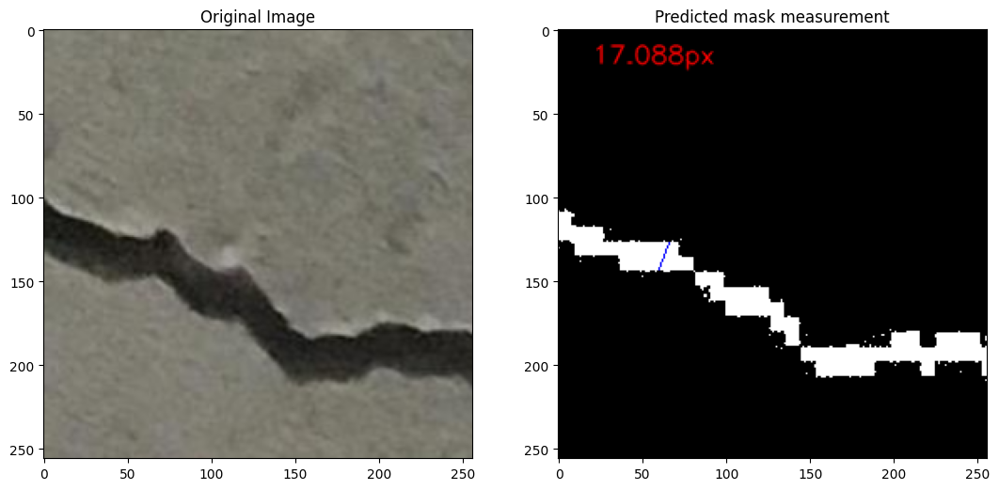

In [ ]:

image_number = random.randint(0, len(images))

image_number = 15
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 4


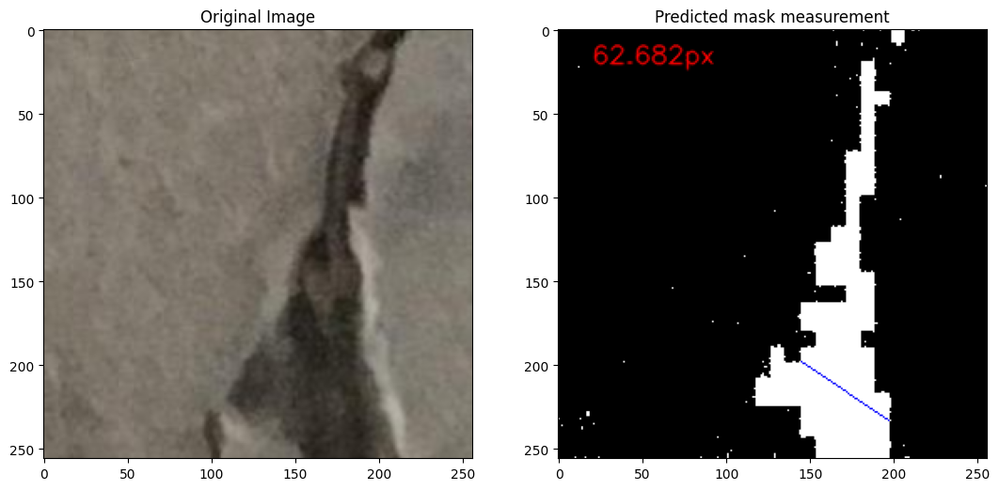

In [ ]:

image_number = random.randint(0, len(images))

image_number = 4
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 5


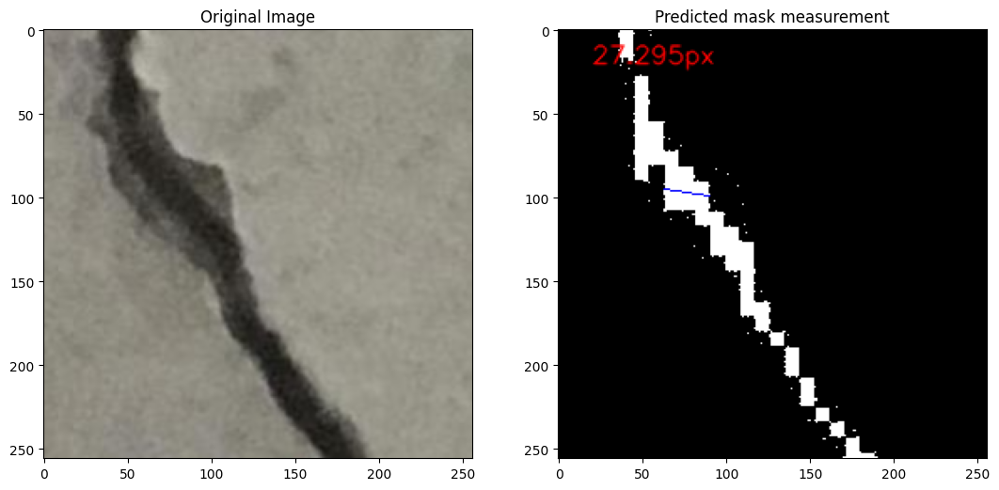

In [ ]:

image_number = random.randint(0, len(images))

image_number = 5
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 7


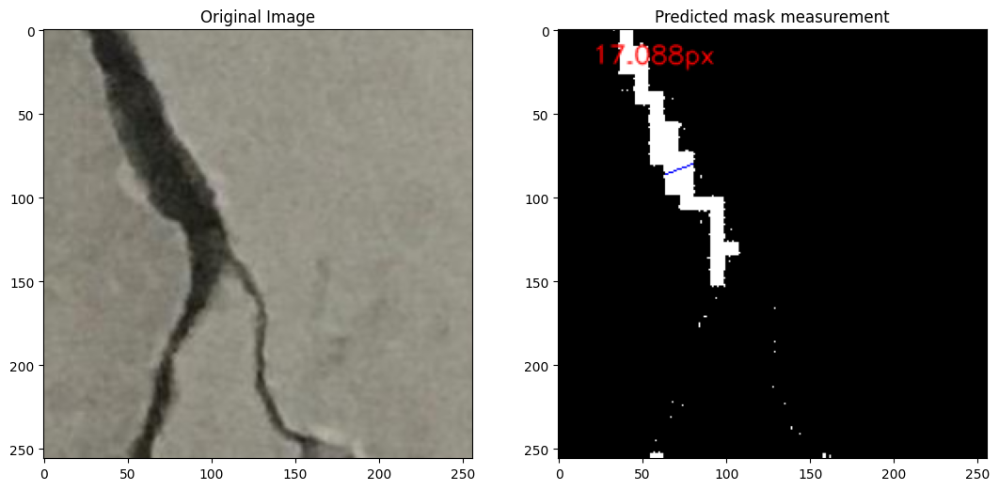

In [ ]:

image_number = random.randint(0, len(images))

image_number = 7
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 6


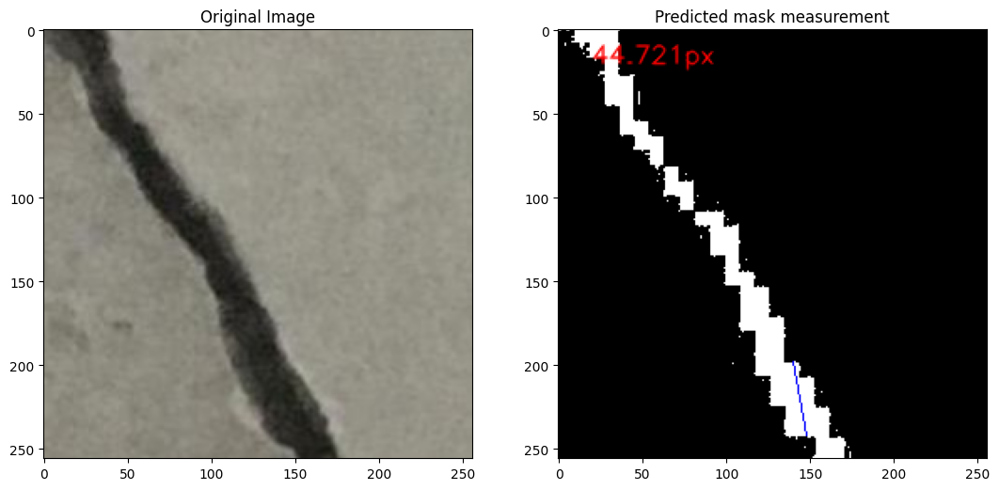

In [ ]:

image_number = random.randint(0, len(images))

image_number = 6
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 11


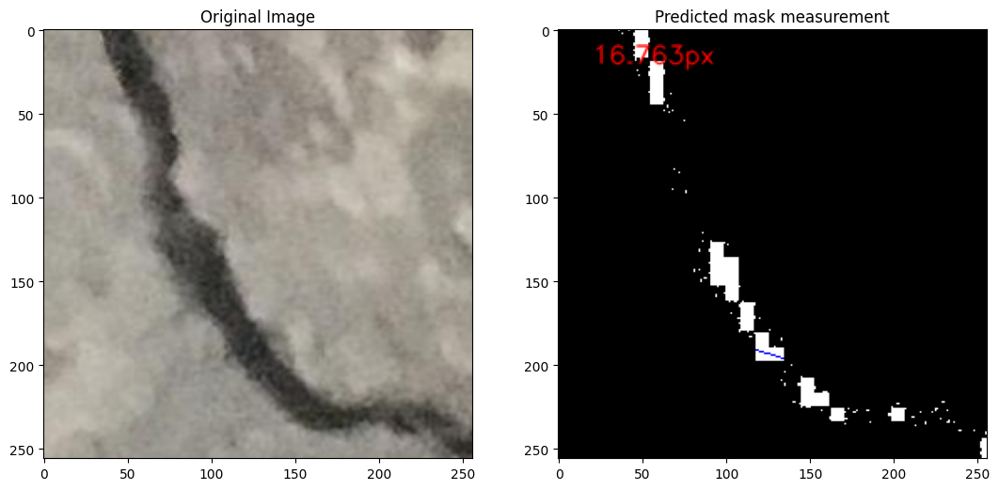

In [ ]:

image_number = random.randint(0, len(images))

image_number = 11
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 12


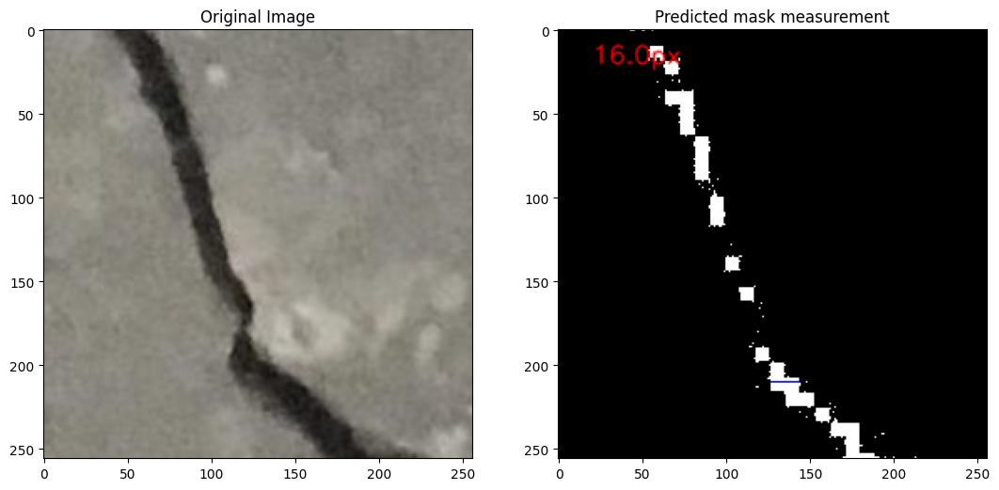

In [ ]:

image_number = random.randint(0, len(images))

image_number = 12
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 13


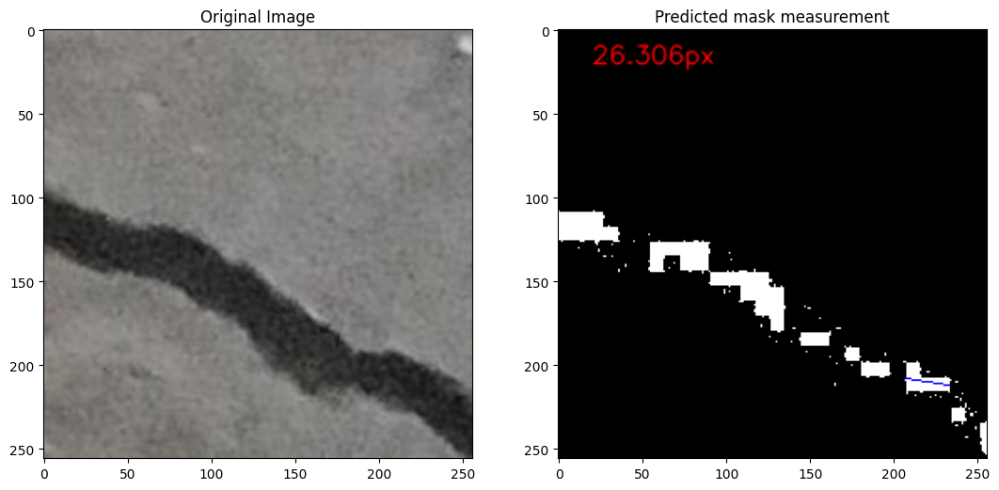

In [ ]:

image_number = random.randint(0, len(images))

image_number = 13
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 14


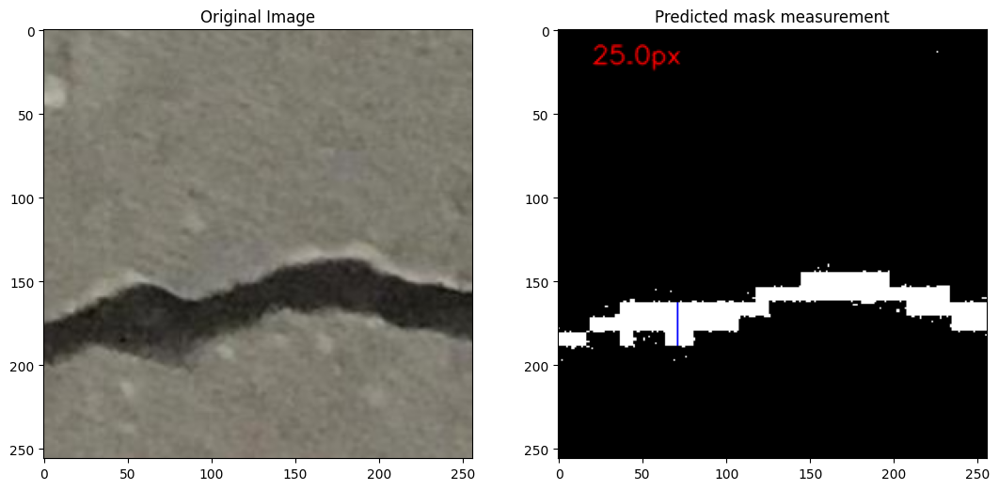

In [ ]:

image_number = random.randint(0, len(images))

image_number = 14
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 15


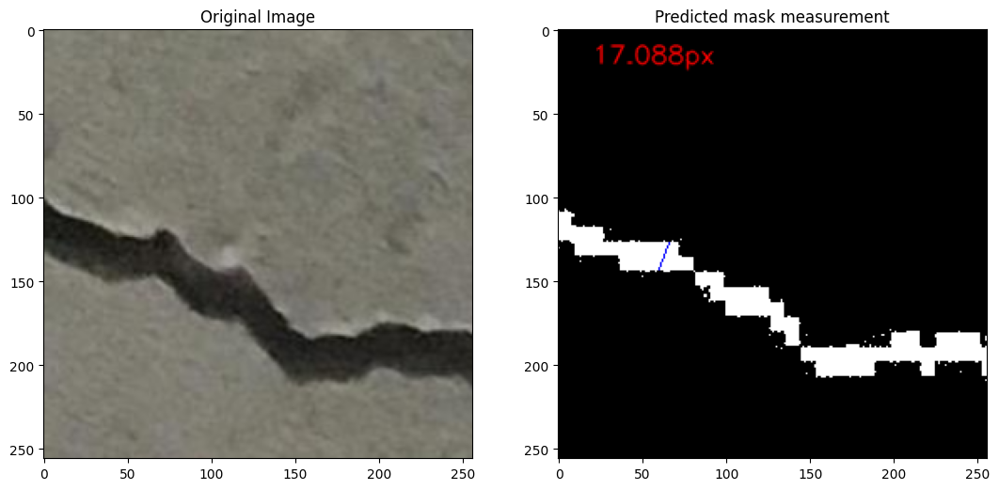

In [ ]:

image_number = random.randint(0, len(images))

image_number = 15
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 17


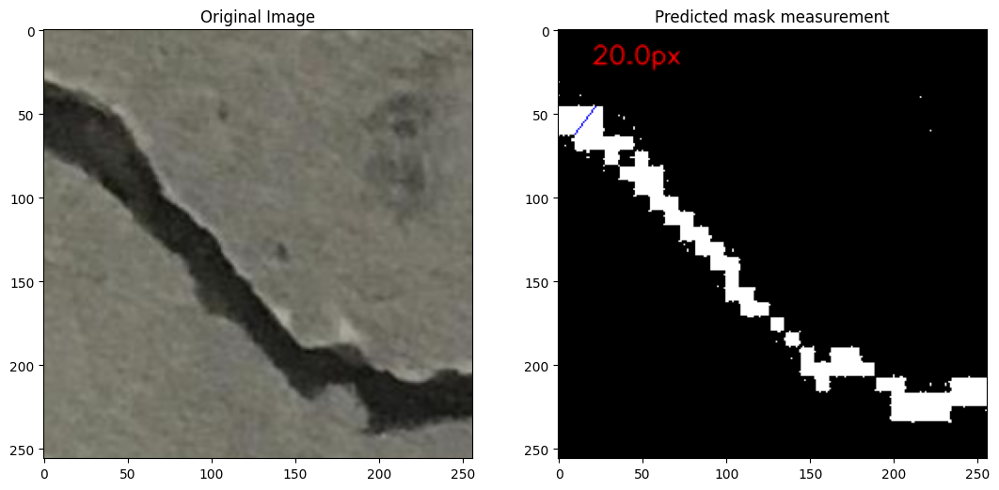

In [ ]:

image_number = random.randint(0, len(images))

image_number = 17
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

analyzing image number: 21


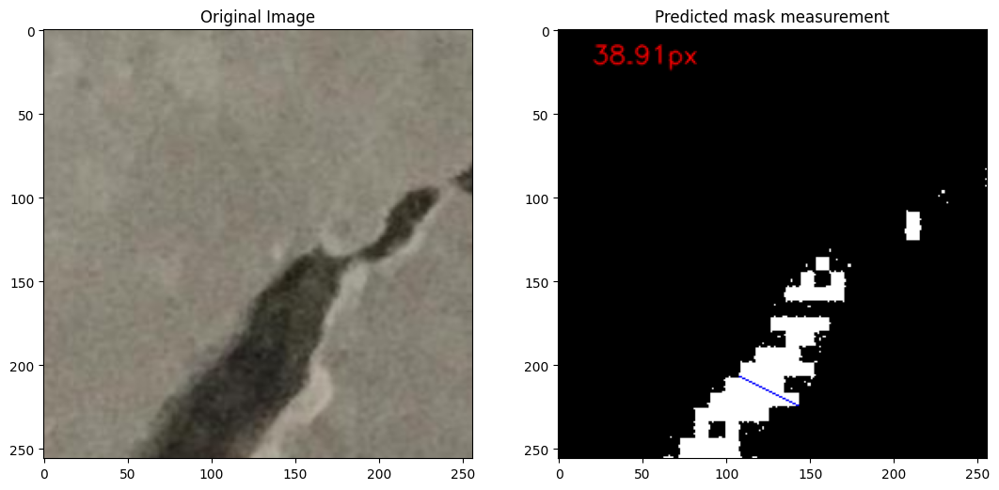

In [ ]:

image_number = random.randint(0, len(images))

image_number =21
print(f"analyzing image number: {image_number}")
#original image

#load ground-truth image
image = np.reshape(images[image_number], (256,256,3))
image1 = np.reshape(masks[image_number], (256,256,3))
#predict

threshold = 0.5
#prediction = (model.predict(np.expand_dims(image, 0))[0,:,:,0] > threshold).astype(np.uint8)
prediction_measurement, predicted_distance = crack_measurement(image1.astype(np.uint8) * 255)


plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.subplot(132)
plt.title('Predicted mask measurement')
plt.imshow(prediction_measurement, cmap='gray')

In [ ]:
# Convert image1 to 8-bit single-channel grayscale
image1_gray = cv2.cvtColor(image1.astype(np.uint8), cv2.COLOR_BGR2GRAY)

# Find contours on the grayscale image
gap_contours, _ = cv2.findContours(image1_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Rest of your code...
gap_pts = [v[0] for v in gap_contours[0]]

# determine the end points of the gap contour by negative dot product
n = len(gap_pts)
gap_ends = [
p for i, p in enumerate(gap_pts)
if np.dot(p - gap_pts[(i-1) % n], gap_pts[(i+1) % n] - p) < 0
]

print(f"Maximum gap found from {gap_ends[0]} to {gap_ends[1]}")

Maximum gap found from [116 255] to [118 255]


In [ ]:

C = tuple(gap_ends[0])
D = tuple(gap_ends[1])
distance = round(calculate_euclidean_distance(C,D),3)
print(f"crack width = {distance}")

crack width = 2.0


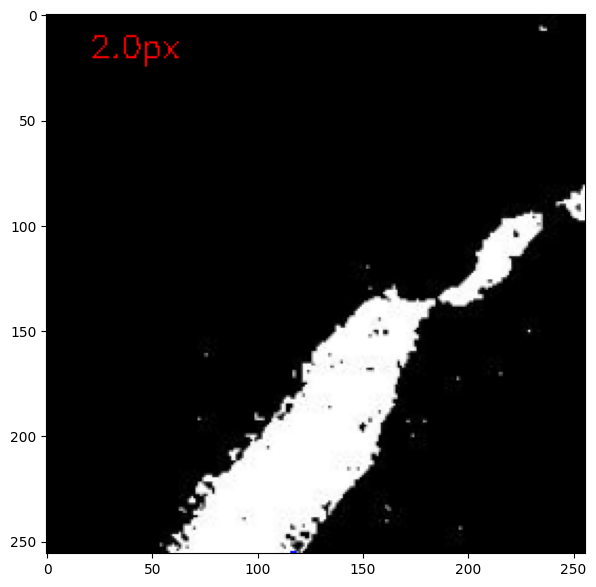

In [ ]:

rgb_original = cv2.line(image1, C, D, color=(0, 0, 255), thickness=1)
text = str(distance) + "px"
rgb_original = cv2.putText(rgb_original, text, (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)

plt.figure(figsize=(7, 7))
plt.imshow(rgb_original)


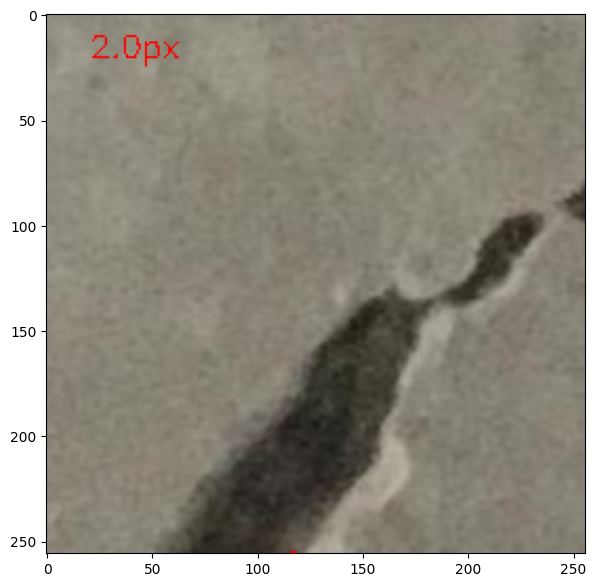

In [ ]:

rgb_original = cv2.line(image, C, D, color=(255, 0, 0), thickness=1)
text = str(distance) + "px"
rgb_original = cv2.putText(image, text, (20, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)

plt.figure(figsize=(7, 7))
plt.imshow(image)

In [ ]:
!pip install keras_unet_collection

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 3.0 MB/s eta 0:00:00


In [ ]:

import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
from datetime import datetime
from PIL import Image
import random
import tensorflow as tf

from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.metrics import MeanIoU

from keras_unet_collection import losses

from sklearn.model_selection import train_test_split

In [ ]:

augmented_images_dir_path = "/content/drive/MyDrive/Crack/img"
augmented_masks_dir_path =  "/content/drive/MyDrive/Crack/mask"

In [ ]:
augmented_masks_dir_path

'/content/drive/Crack/mask'

In [ ]:

image_names = glob.glob(f"{augmented_images_dir_path}/*.jpg")
image_names.sort()


image_dataset = []

for image_name in image_names:
      image = cv2.imread(image_name, 1)
      image = Image.fromarray(image)
      image_dataset.append(np.array(image))


In [ ]:

mask_names = glob.glob(f"{augmented_masks_dir_path}/*.jpg")
mask_names.sort()

mask_dataset = []

for image_name in mask_names:
        image = cv2.imread(image_name, 0)
        image = np.where(image>0, 255, image)
        image = Image.fromarray(image)
        mask_dataset.append(np.array(image))

In [ ]:

names = []
for i in range(len(os.listdir(augmented_masks_dir_path))):
  img_name = image_names[i].split("/")[-1]
  mask_name = mask_names[i].split("/")[-1]

  n1 = img_name.split(".")[0]
  n2 = mask_name.split(".")[0]
  names.append(n1==n2)

all(names)


True

In [ ]:

image_dataset = np.array(image_dataset)/255.
mask_dataset = np.expand_dims((np.array(mask_dataset)),3) /255.


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(image_dataset, mask_dataset, test_size = 0.20, random_state = 9)


In [ ]:
X_train.shape

(32, 227, 227, 3)

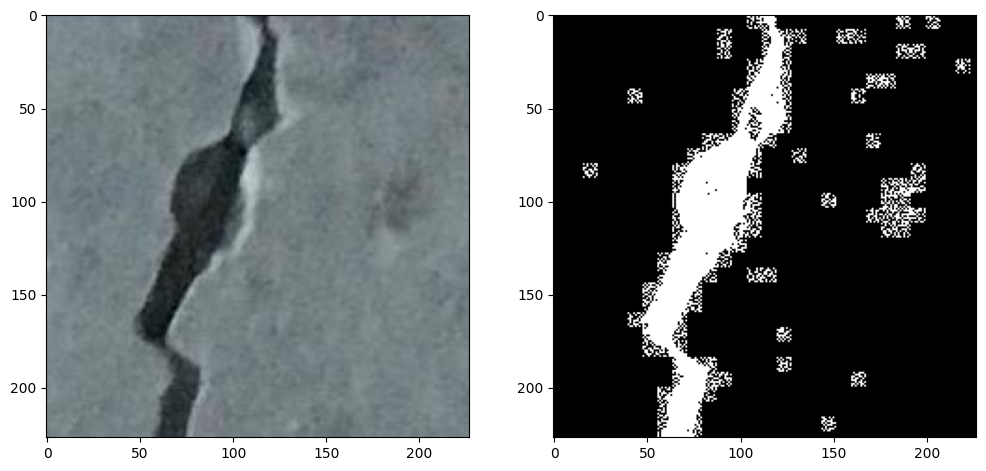

In [ ]:
image_number = random.randint(0, len(X_train))
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(X_train[image_number], (227, 227, 3)), cmap='gray')
plt.subplot(122)
plt.imshow(np.reshape(y_train[image_number], (227, 227)), cmap='gray')
plt.show()

In [ ]:

import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

from sklearn.neural_network import BernoulliRBM
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn import metrics

from skimage.transform import resize
from skimage.io import imread_collection, imshow

In [ ]:
import keras
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from numpy import zeros, random

# Data
from tensorflow.image import resize
from keras.preprocessing.image import load_img, img_to_array

# Data viz
import matplotlib.pyplot as plt

# Model
from keras.models import Model, Sequential, load_model
from keras.layers import Conv2D, Conv2DTranspose, concatenate, MaxPool2D, Dropout, BatchNormalization, Layer, Input, add, multiply, UpSampling2D

# Model Viz
from tensorflow.keras.utils import plot_model

# Callback
from keras.callbacks import Callback

In [ ]:
def load_image(path):
    img = resize( img_to_array( load_img(path) )/255. , (256,256))
    return img

In [ ]:
root_path = '/content/drive/MyDrive/Crack/'

In [ ]:
root_path = '/content/drive/MyDrive/Crack/img/'
image_paths = sorted(glob(root_path + f"*.jpg"))
mask_paths = []
for path in image_paths:
    mask_path = path.replace('Image','Mask')
    mask_path = mask_path.replace('.jpg','.jpg')
    mask_paths.append(mask_path)
print(f"Total Number of Images  : {len(image_paths)}")

Total Number of Images  : 40


In [ ]:
images = zeros(shape=(len(image_paths), 256, 256, 3))
masks = zeros(shape=(len(image_paths), 256, 256, 3))
for n, (img_path, mask_path) in tqdm(enumerate(zip(image_paths, mask_paths)), desc="Loading"):
    images[n] = load_image(img_path)
    masks[n] = load_image(mask_path)

Loading: 40it [00:00, 50.65it/s]


In [ ]:
class Encoder(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(Encoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', activation='relu')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', activation='relu')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c2(self.drop(self.c1(X)))
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "rate":self.rate,
            "pooling":self.pooling,
        }

In [ ]:
class Decoder(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(Decoder, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.cT = Conv2DTranspose(filters, kernel_size=3, strides=2, padding='same', kernel_initializer='he_normal', activation='relu')
        self.net = Encoder(filters, rate, pooling=False)

    def call(self, X):
        x, skip_x = X
        x = self.cT(x)

        c = concatenate([x, skip_x])
        f = self.net(c)
        return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "rate":self.rate
        }

In [ ]:
class AttentionGate(Layer):

    def __init__(self, filters, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters

        self.normal = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', activation='relu')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', kernel_initializer='he_normal', activation='relu')

        self.learn = Conv2D(1, kernel_size=1, strides=1, activation='sigmoid')
        self.resample = UpSampling2D()

    def call(self, X):
        x, skip_x = X

        x = self.normal(x)
        skip = self.down(skip_x)
        a = add([x, skip])

        l = self.learn(a)
        l = self.resample(l)

        f = multiply([l, skip_x])
        return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters
        }

In [ ]:
image_input = Input(shape=(256,256,3), name="InputImage")

# Encoder Phase
p1, c1 = Encoder(32, 0.1, name="EncoderBlock1")(image_input)
p2, c2 = Encoder(64, 0.1, name="EncoderBlock2")(p1)
p3, c3 = Encoder(128, 0.2, name="EncoderBlock3")(p2)
p4, c4 = Encoder(256, 0.2, name="EncoderBlock4")(p3)

# Latent Representation
encoding = Encoder(512, 0.3, pooling=False, name="Encoding")(p4)

# Deocder + Attention Phase
a1 = AttentionGate(256, name="Attention1")([encoding, c4])
d1 = Decoder(256, 0.2, name="DecoderBlock1")([encoding, a1])

a2 = AttentionGate(128, name="Attention2")([d1, c3])
d2 = Decoder(128, 0.2, name="DecoderBlock2")([d1, a2])

a3 = AttentionGate(64, name="Attention3")([d2, c2])
d3 = Decoder(64, 0.2, name="DecoderBlock3")([d2, a3])

a4 = AttentionGate(32, name="Attention4")([d3, c1])
d4 = Decoder(32, 0.1, name="DecoderBlock4")([d3, a4])

# Output Layer
mask_out = Conv2D(3, kernel_size=1, strides=1, activation='sigmoid', padding='same', name="MaskOut")(d4)

# Model
att_unet = Model(
    inputs=[image_input], outputs=[mask_out], name="AttentionUNet"
)

# Compile
att_unet.compile(
    loss='binary_crossentropy',
    optimizer='adam'
)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:372: UserWarning: `build()` was called on layer 'Encoding', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:372: UserWarning: `build()` was called on layer 'encoder_8', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:372: UserWarning: `build()` was called on layer 'encoder_9', however the layer does not have a 

In [ ]:
def show_image(image, alpha=1, title=None):
    plt.imshow(image, alpha=alpha)
    plt.title(title)
    plt.axis('off')

In [ ]:
def show_mask(image, mask, alpha=0.6):
    show_image(image)
    show_image(mask, alpha=alpha)

In [ ]:
def get_random_data(data='train'):
    if data=='train':
        id = np.random.randint(len(train_images))
        image = train_images[id]
        mask = train_masks[id]
        return image, mask
    else:
        id = np.random.randint(len(test_images))
        image = test_images[id]
        mask = test_masks[id]
        return image, mask

In [ ]:
def show_predictions(model, n_images=5):
    for i in range(n_images):
        plt.figure(figsize=(10,8))

        image, mask = get_random_data(data='test')
        pred_mask = model.predict(image[np.newaxis,...])[0]

        plt.subplot(1,3,1)
        show_image(image, title='Original Image')

        plt.subplot(1,3,2)
        show_image(mask, title='Original Mask')

        plt.subplot(1,3,3)
        show_image(pred_mask, title='Predicted Mask')

        plt.show()

In [ ]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        show_predictions(model=self.model, n_images=1)

In [ ]:
train_images, train_masks = images[:30], masks[:30]
test_images, test_masks = images[30:], masks[30:]

In [ ]:
BATCH_SIZE = 16
SPE = len(train_images)//BATCH_SIZE

In [ ]:
att_unet.fit(
    train_images, train_masks,
    epochs=10,
    batch_size=BATCH_SIZE,
    steps_per_epoch=SPE,
    callbacks=[ModelCheckpoint("AttentionUNet.keras", save_best_only=True), ShowProgress()]
)

In [ ]:

from keras_unet_collection.models import att_unet_2d

In [ ]:

model = att_unet_2d((256,256 ,3),
                      filter_num=[64, 128, 256, 512, 1024],
                      n_labels=1,
                      stack_num_down=2,
                      stack_num_up=2, activation='ReLU',
                      atten_activation='ReLU'
                      , attention='add',
                      output_activation='Sigmoid',
                      batch_norm=True,
                      pool=False,
                      unpool=False,
                      backbone='VGG16',
                      weights='imagenet',
                      freeze_backbone=True,
                      freeze_batch_norm=True,
                      name='attunet'
                      )

In [ ]:

from keras_unet_collection import losses
metrics_set=[ tf.keras.metrics.BinaryIoU(target_class_ids=[1]), losses.dice_coef]

In [ ]:
model.compile(loss=tf.keras.losses.binary_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              metrics=metrics_set)

In [ ]:

IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]
input_shape = (IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS)
num_labels = 1  #Binary
batch_size = 3
epochs = 50

In [ ]:
filepath = '/content/drive/mydrive/Leaf/attunet_model.keras'
checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor="val_dice_coef",
                             verbose=1,
                             save_best_only=True,
                             mode="max")

earlyStopping = EarlyStopping(patience=5)

callbacks = [checkpoint, earlyStopping]

In [ ]:

from keras_unet_collection.models import att_unet_2d

In [ ]:
model = att_unet_2d((256, 256, 3),
                      filter_num=[64, 128, 256, 512, 1024],
                      n_labels=1,
                      stack_num_down=2,
                      stack_num_up=2, activation='ReLU',
                      atten_activation='ReLU'
                      , attention='add',
                      output_activation='Sigmoid',
                      batch_norm=True,
                      pool=False,
                      unpool=False,
                      backbone='VGG16',
                      weights='imagenet',
                      freeze_backbone=True,
                      freeze_batch_norm=True,
                      name='attunet'
                      )


/usr/local/lib/python3.10/dist-packages/keras_unet_collection/_backbone_zoo.py:45: UserWarning: 

Backbone VGG16 does not use batch norm, but other layers received batch_norm=True
  warnings.warn(param_mismatch);


In [ ]:

model.compile(loss=tf.keras.losses.binary_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              metrics=metrics_set)

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(images,masks, test_size = 0.20, random_state = 9)

In [ ]:
X_train.shape

(32, 256, 256, 3)

In [ ]:

start = datetime.now()
history = model.fit(X_train, y_train,
                    verbose=1,
                    batch_size = batch_size,
                    validation_data=(X_test, y_test ),
                    epochs=epochs,
                    callbacks=callbacks)

stop = datetime.now()

Epoch 1/50


ValueError: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 256, 256, 3), output.shape=(None, 256, 256, 1)

In [ ]:
def load_image(path):
    img = resize( img_to_array( load_img(path) )/255. , (227,227))
    return img

In [ ]:
root_path = '/content/drive/My Drive/Crack/'

In [ ]:
root_path = '/content/drive/My Drive/Crack/img/'
image_paths = sorted(glob(root_path + f"*.jpg"))
mask_paths = []
for path in image_paths:
    mask_path = path.replace('img','mask')
    mask_path = mask_path.replace('.jpg','.jpg')
    mask_paths.append(mask_path)
print(f"Total Number of Images  : {len(image_paths)}")

Total Number of Images  : 40


In [ ]:
images = zeros(shape=(len(image_paths), 227,227, 3))
masks = zeros(shape=(len(image_paths), 227,227, 3))
for n, (img_path, mask_path) in tqdm(enumerate(zip(image_paths, mask_paths)), desc="Loading"):
    images[n] = load_image(img_path)
    masks[n] = load_image(mask_path)

Loading: 40it [00:00, 68.37it/s]


In [ ]:
images = zeros(shape=(len(image_paths), 256, 256, 3))
masks = zeros(shape=(len(image_paths), 256, 256, 3))
for n, (img_path, mask_path) in tqdm(enumerate(zip(image_paths, mask_paths)), desc="Loading"):
    images[n] = load_image(img_path)
    masks[n] = load_image(mask_path)

Loading: 40it [00:00, 62.31it/s]


In [ ]:
def show_image(image, title=None, alpha=1):
    plt.imshow(image, alpha=alpha)
    plt.title(title)
    plt.axis('off')

In [ ]:
def show_mask(GRID, fig_size=(8,20), model=None, join=False, alpha=0.5):

    # Config the GRID
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    n = 1
    plt.figure(figsize=fig_size)
    for i in range(1,n_images+1):

        if model is None:

            if join:

                # Seect a Random Image and mask
                id = random.randint(len(images))
                image, mask = images[id], masks[id]

                # plot the Mask over the Image
                plt.subplot(n_rows, n_cols, i)
                show_image(image)
                show_image(mask, alpha=alpha)

            else:

                if i%2==0:
                    plt.subplot(n_rows,n_cols,i)
                    show_image(mask)

                else:
                    # Seect a Random Image and mask
                    id = random.randint(len(images))
                    image, mask = images[id], masks[id]

                    # Plot Image
                    plt.subplot(n_rows,n_cols,i)
                    show_image(image)
        else:
            if join:

                if i%2==0:
                    # plot the Mask over the Image
                    plt.subplot(n_rows, n_cols, i)
                    show_image(image)
                    show_image(pred_mask, alpha=alpha, title="Predicted Mask")
                else:
                    # Seect a Random Image and mask
                    id = random.randint(len(images))
                    image, mask = images[id], masks[id]
                    pred_mask = model.predict(tf.expand_dims(image, axis=0))[0]

                    # plot the Mask over the Image
                    plt.subplot(n_rows, n_cols, i)
                    show_image(image)
                    show_image(mask, alpha=alpha, title="Original Mask")
            else:
                if n==1:
                    # Seect a Random Image and mask
                    id = random.randint(len(images))
                    image, mask = images[id], masks[id]
                    pred_mask = model.predict(tf.expand_dims(image, axis=0))[0]

                    # plot the Mask over the Image
                    plt.subplot(n_rows, n_cols, i)
                    show_image(image, title="Original Image")
                    n+=1

                elif n==2:
                    # plot the Mask over the Image
                    plt.subplot(n_rows, n_cols, i)
                    show_image(mask, title="Original Mask")
                    n+=1
                elif n==3:
                    # plot the Mask over the Image
                    plt.subplot(n_rows, n_cols, i)
                    show_image(pred_mask, title="Predicted Mask")
                    n=1
    plt.show()

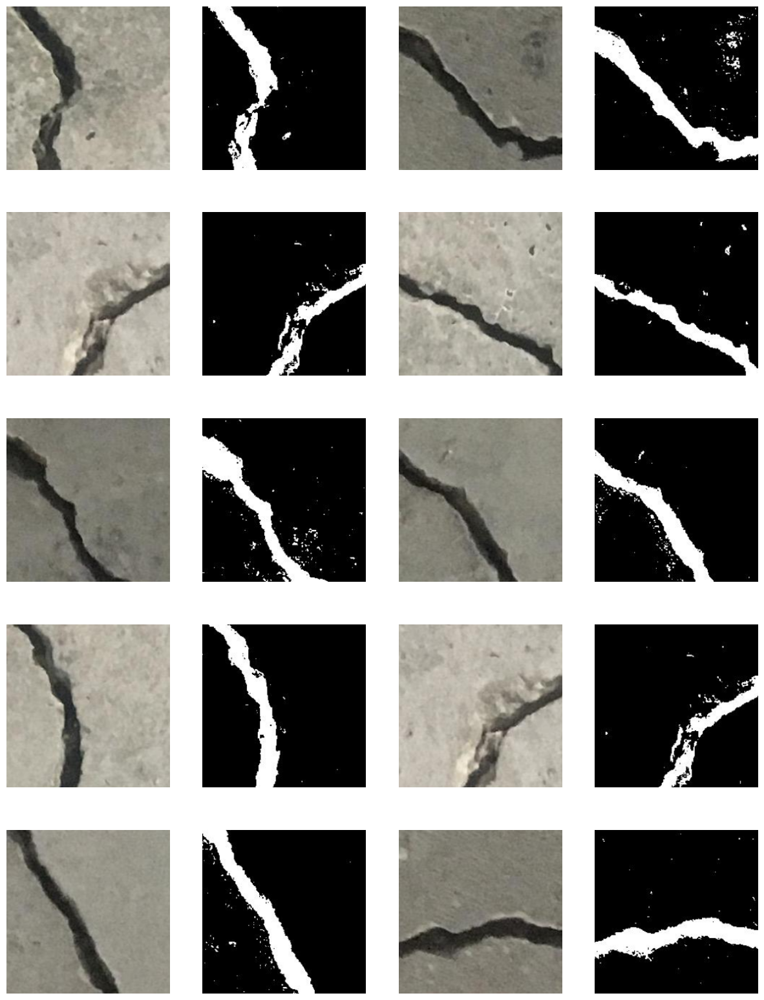

In [ ]:
GRID = [5,4]
show_mask(GRID, fig_size=(15,20), join=False)

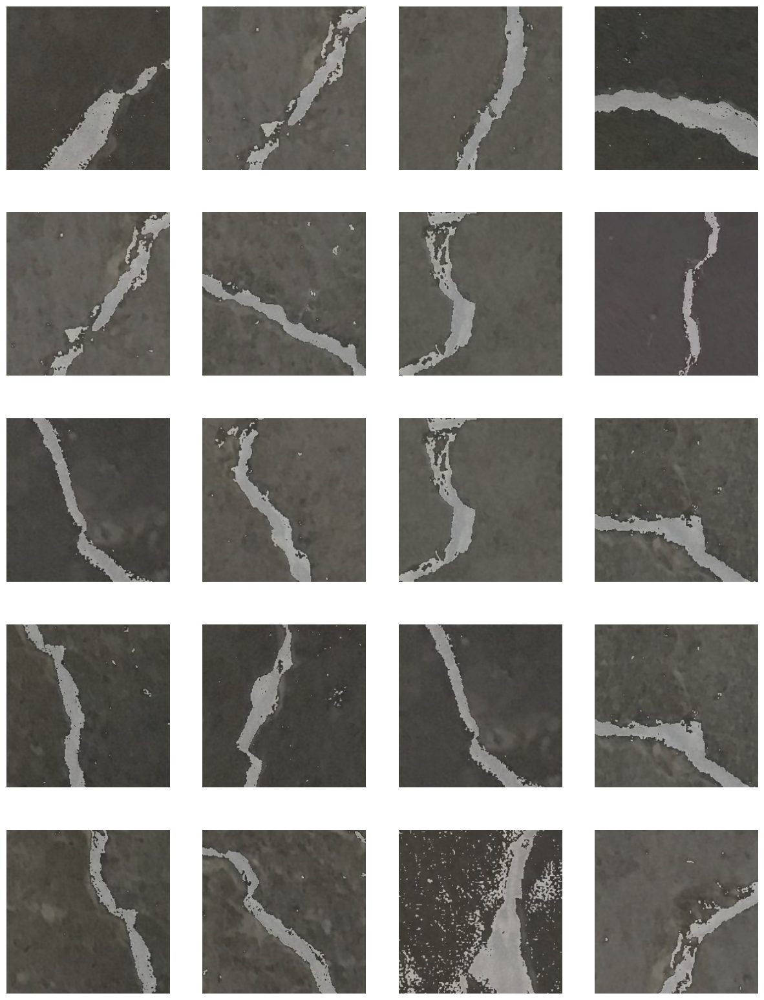

In [ ]:
GRID = [5,4]
show_mask(GRID, fig_size=(15,20), join=True)

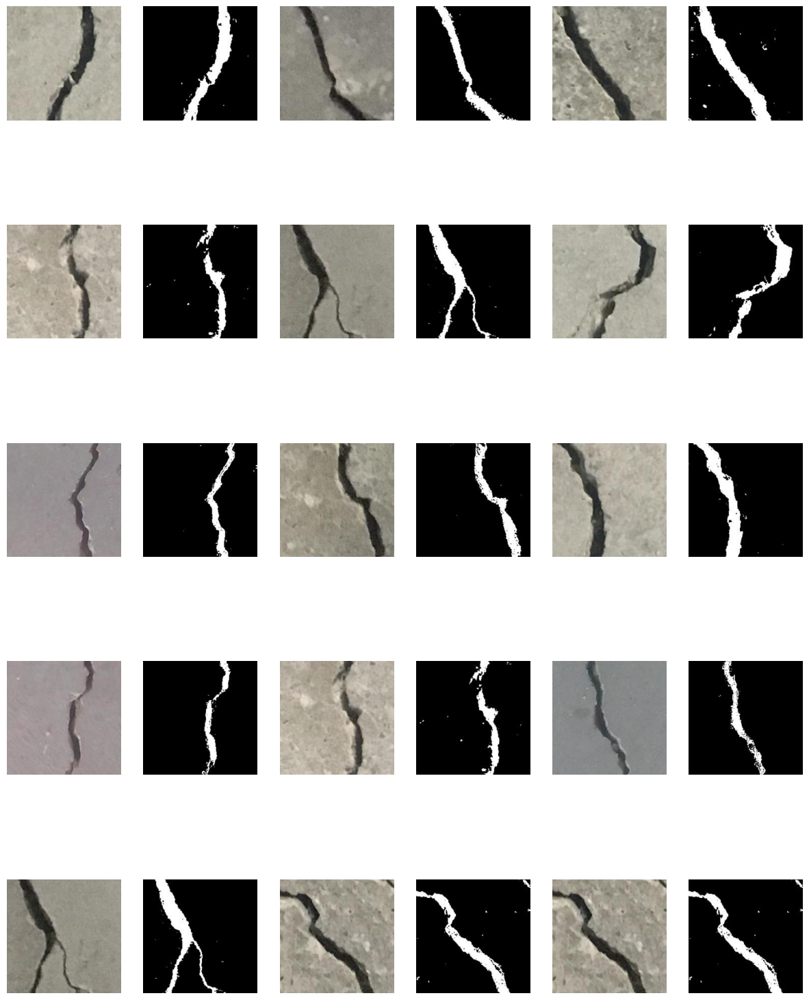

In [ ]:
GRID = [5,6]
show_mask(GRID, fig_size=(15,20))

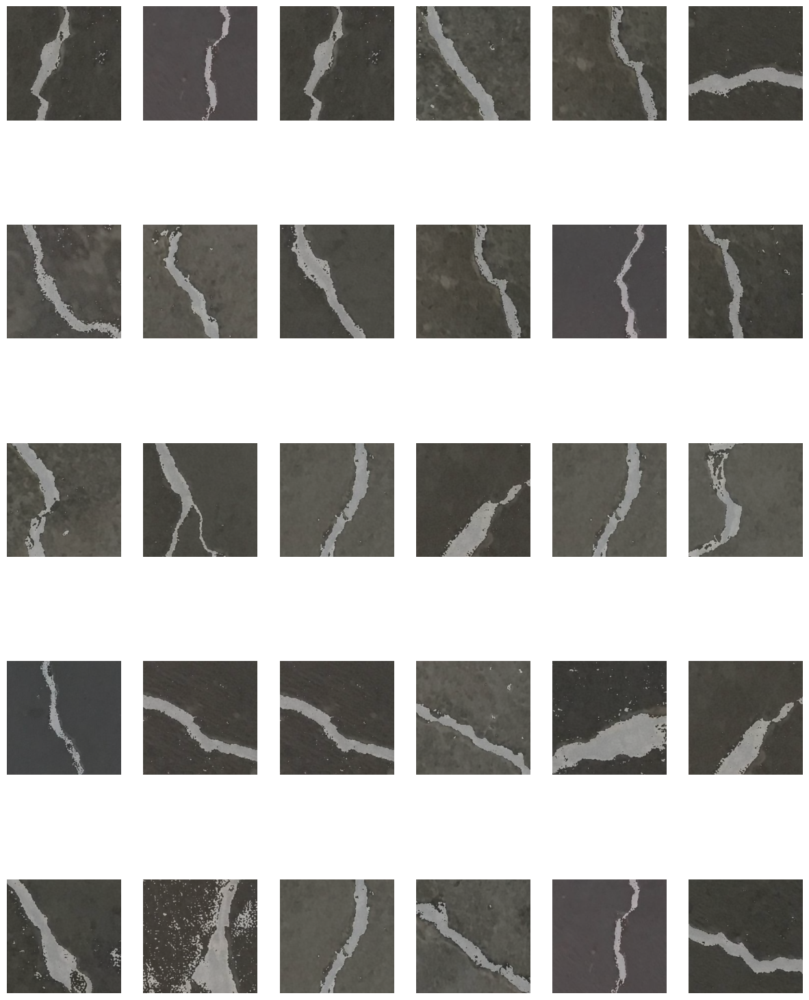

In [ ]:
GRID = [5,6]
show_mask(GRID, fig_size=(15,20), join=True)

In [ ]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        show_mask(GRID=[1,1], model=self.model, join=False, fig_size=(20,8))
        self.model.save("/content/drive/My Drive/Leaf/Image/AttentionUnet.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


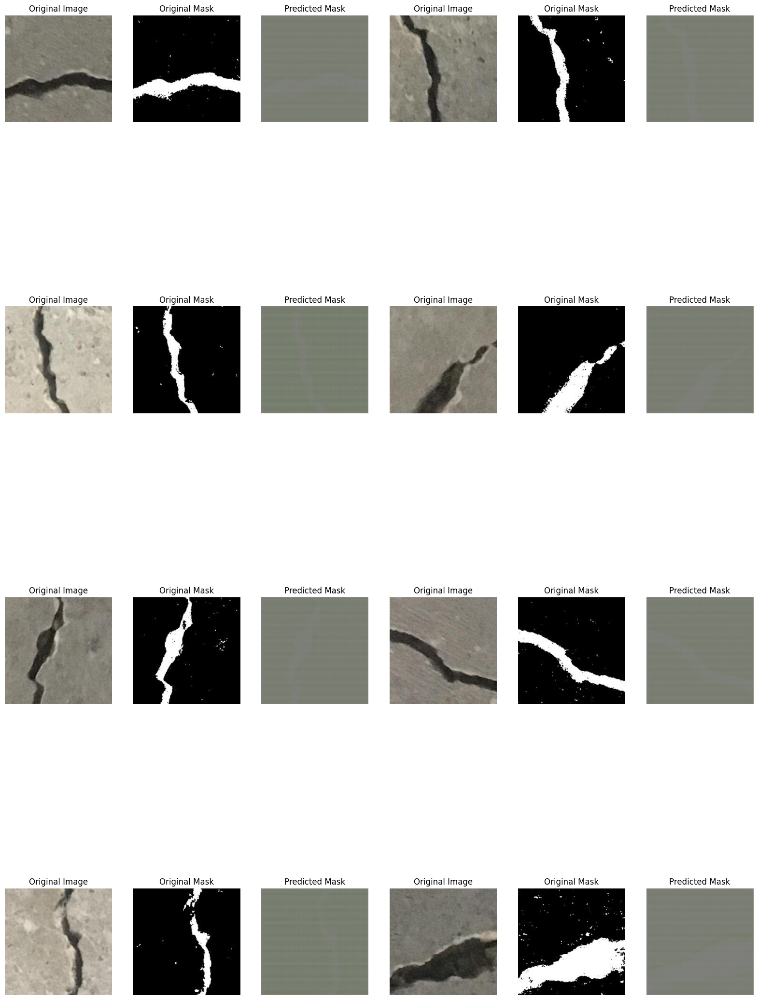

In [ ]:
show_mask(GRID=[4,6], model=att_unet, join=False, fig_size=(20,30))